# Base de dados do censo

## Pré-processamento

### Importação das bibliotecas

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.naive_bayes import GaussianNB

### Exploração dos dados

In [2]:
base_censo = pd.read_csv('bases/census.csv')
base_censo

,age,workclass,final-weight,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loos,hour-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32557,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32558,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32559,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [3]:
base_censo.describe() # mostra algumas estatísticas sobre os dados apresentados

,age,final-weight,education-num,capital-gain,capital-loos,hour-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [4]:
base_censo.isnull().sum() # verificando se há valores faltantes em algum dos atributos

age               0
workclass         0
final-weight      0
education         0
education-num     0
marital-status    0
occupation        0
relationship      0
race              0
sex               0
capital-gain      0
capital-loos      0
hour-per-week     0
native-country    0
income            0
dtype: int64

### Visualização dos dados

In [5]:
np.unique(base_censo['income'], return_counts=True)

(array([' <=50K', ' >50K'], dtype=object), array([24720,  7841]))

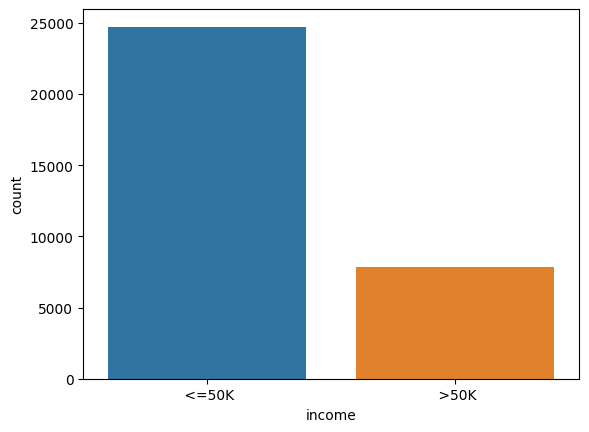

In [6]:
sns.countplot(x = base_censo['income']);

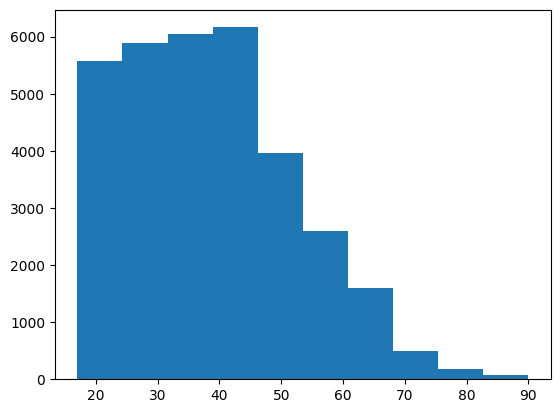

In [7]:
 plt.hist(x = base_censo['age']);

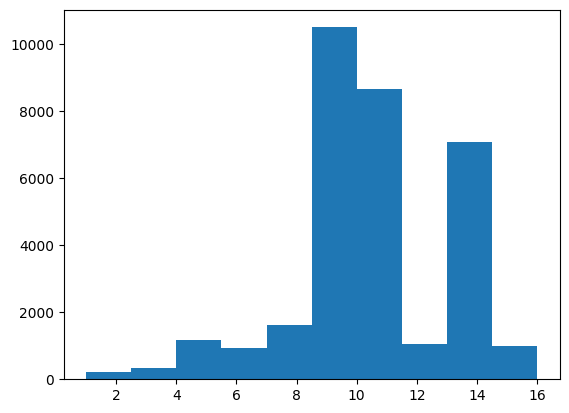

In [8]:
plt.hist(x = base_censo['education-num']);

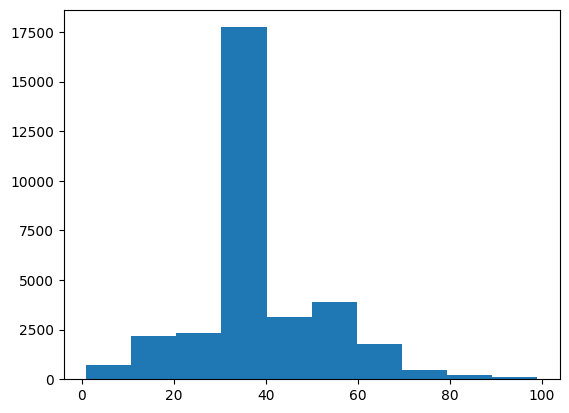

In [9]:
plt.hist(x = base_censo['hour-per-week']);

In [12]:
grafico = px.treemap(base_censo, path=['workclass', 'age'])
grafico.show()

In [13]:
grafico = px.treemap(base_censo, path=['occupation', 'relationship'])
grafico.show()

In [14]:
grafico = px.parallel_categories(base_censo, dimensions=['occupation', 'relationship'])
grafico.show()

In [15]:
grafico = px.parallel_categories(base_censo, dimensions=['workclass', 'occupation', 'income'])
grafico.show()

In [16]:
grafico = px.parallel_categories(base_censo, dimensions=['education', 'income'])
grafico.show()

### Divisão entre previsores e classe

In [17]:
base_censo.columns

Index(['age', 'workclass', 'final-weight', 'education', 'education-num',
       'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'capital-gain', 'capital-loos', 'hour-per-week', 'native-country',
       'income'],
      dtype='object')

In [18]:
# lembrando: é necessário fazer a divisão entre os atributos que são previsores e o atributo de classe 
# (nesse caso, income)
X_censo = base_censo.iloc[:, 0:14].values
X_censo

array([[39, ' State-gov', 77516, ..., 0, 40, ' United-States'],
       [50, ' Self-emp-not-inc', 83311, ..., 0, 13, ' United-States'],
       [38, ' Private', 215646, ..., 0, 40, ' United-States'],
       ...,
       [58, ' Private', 151910, ..., 0, 40, ' United-States'],
       [22, ' Private', 201490, ..., 0, 20, ' United-States'],
       [52, ' Self-emp-inc', 287927, ..., 0, 40, ' United-States']],
      dtype=object)

In [19]:
y_censo = base_censo.iloc[:, 14].values
y_censo

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

### Tratamento de atributos categóricos

#### LabelEncoder

In [20]:
# atributos categóricos são strings
# não é possível realizar os cálculos matemáticos necessários para a aplicação de algoritmos de aprendizagem 
# e classificação nas strings, portanto, estes dados precisam de tratamento
from sklearn.preprocessing import LabelEncoder

In [21]:
X_censo[:, 1]

array([' State-gov', ' Self-emp-not-inc', ' Private', ..., ' Private',
       ' Private', ' Self-emp-inc'], dtype=object)

In [22]:
label_encoder_teste = LabelEncoder()
teste = label_encoder_teste.fit_transform(X_censo[:, 1])

In [23]:
teste

array([7, 6, 4, ..., 4, 4, 5])

In [24]:
X_censo[0]

array([39, ' State-gov', 77516, ' Bachelors', 13, ' Never-married',
       ' Adm-clerical', ' Not-in-family', ' White', ' Male', 2174, 0, 40,
       ' United-States'], dtype=object)

In [25]:
# é preciso criar uma variável que referencie o LabelEncoder para cada atributo categórico

label_encoder_workclass = LabelEncoder()
label_encoder_education = LabelEncoder()
label_encoder_marital = LabelEncoder()
label_encoder_occupation = LabelEncoder()
label_encoder_relationship = LabelEncoder()
label_encoder_race = LabelEncoder()
label_encoder_sex = LabelEncoder()
label_encoder_country = LabelEncoder()

In [26]:
# fazendo a transformação de cada atributo categórico
X_censo[:,1] = label_encoder_workclass.fit_transform(X_censo[:,1])
X_censo[:,3] = label_encoder_education.fit_transform(X_censo[:,3])
X_censo[:,5] = label_encoder_marital.fit_transform(X_censo[:,5])
X_censo[:,6] = label_encoder_occupation.fit_transform(X_censo[:,6])
X_censo[:,7] = label_encoder_relationship.fit_transform(X_censo[:,7])
X_censo[:,8] = label_encoder_race.fit_transform(X_censo[:,8])
X_censo[:,9] = label_encoder_sex.fit_transform(X_censo[:,9])
X_censo[:,13] = label_encoder_country.fit_transform(X_censo[:,13])

In [27]:
X_censo[0]

array([39, 7, 77516, 9, 13, 4, 1, 1, 4, 1, 2174, 0, 40, 39], dtype=object)

#### OneHotEncoder

In [28]:
# Gol Palio Uno -> diferentes categorias de carros
#  1    2    3  -> o algoritmo de aprendizagem pode considerar o maior valor como mais importante/atribuir um
#                  peso maior
# esse é o problema do LabelEncoder

# no OneHotEncoder, temos não apenas 1 coluna para os atributos da categoria (carro, por exemplo), mas sim
# várias colunas (a mesma quantidade de atributos únicos, no caso da categoria Carro, 3)

# para conseguir a quantidade de atributos únicos:
len(np.unique(base_censo['workclass'])) 
# teria 9 atributos únicos
# 1 0 0 0 0 0 0 0 0 
# 0 0 0 0 1 0 0 0 0

9

In [29]:
len(np.unique(base_censo['occupation'])) 

15

In [30]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [31]:
onehotencoder_censo = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [1,3,5,6,7,8,9,13])], remainder='passthrough')

In [32]:
X_censo = onehotencoder_censo.fit_transform(X_censo).toarray()

In [33]:
X_censo

array([[0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 2.1740e+03, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        1.3000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       ...,
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        2.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.5024e+04, 0.0000e+00,
        4.0000e+01]])

In [34]:
X_censo[0]

array([0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
       0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e

In [35]:
X_censo.shape # mostra o somatório de todos os valores únicos de cada atributo categórico 

(32561, 108)

### Escalonamento dos valores

In [36]:
from sklearn.preprocessing import StandardScaler
# estamos trabalhando com a técnica da padronização, não da normalização

scaler_censo = StandardScaler()
X_censo = scaler_censo.fit_transform(X_censo)

In [37]:
X_censo[0]

array([-0.2444502 , -0.17429511, -0.26209736, -0.01466381, -1.5167923 ,
       -0.18838933, -0.29093568,  4.90769968, -0.02073999, -0.17175325,
       -0.19348662, -0.11609195, -0.07201601, -0.10164955, -0.1422718 ,
       -0.12664495, -0.18406376, -0.21053433,  2.25399324, -0.11334387,
       -0.68994199, -0.23637391, -0.03960742, -0.13419553, -0.53714425,
       -0.39750806, -0.02658695, -0.92284068, -0.11403678,  1.43105786,
       -0.1802846 , -0.17735813, -0.24494366,  2.76348874, -0.01662771,
       -0.37949517, -0.37774555, -0.17745022, -0.20957797, -0.25595432,
       -0.33554133, -0.06780164, -0.38166338, -0.14260848, -0.35531609,
       -0.17127887, -0.22710355, -0.82533335,  1.70899099, -0.17624972,
       -0.42934582, -0.34403232, -0.22492681, -0.09820087, -0.18155194,
       -0.32576824, -0.09161163,  0.4130197 , -0.70307135,  0.70307135,
       -0.13502327, -0.02416321, -0.06107342, -0.0480488 , -0.04260602,
       -0.05409379, -0.04641598, -0.02933708, -0.05714946, -0.05

## Divisão das bases em treinamento e teste

In [38]:
# para fazer a divisão da base entre treinamento e teste, vamos utilizar a função train_test_split do
# módulo model_selection, da biblioteca scikit-learn

from sklearn.model_selection import train_test_split


In [39]:
# as bases separadas serão armazenadas em variáveis diferentes
X_censo_treinamento, X_censo_teste, y_censo_treinamento, y_censo_teste = train_test_split(X_censo, y_censo, test_size = 0.15, random_state=0)

# lembrando que a letra X indica que temos os attr previsores e y indica que temos a classe

# o random_state faz com que os valores de treinamento e os valores de teste permaneçam os mesmos, o que 
# facilita a questão de comparar os resultados

In [40]:
X_censo_treinamento.shape

(27676, 108)

In [41]:
y_censo_treinamento.shape

(27676,)

In [42]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

## Salvar as variáveis/bases de dados

In [43]:
import pickle

In [44]:
# a extensão pkl é para usar no pickle
# wb é para escrever

with open('censo.pkl', mode = 'wb') as f:
    pickle.dump([X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste], f)

# Aplicação do Naive Bayes - 47,6%

In [45]:
with open('censo.pkl', 'rb') as f:
    X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste = pickle.load(f)
    
# carregando as variáveis de treinamento e teste

In [46]:
X_censo_treinamento.shape, y_censo_treinamento.shape

((27676, 108), (27676,))

In [47]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

In [48]:
# fazendo o treinamento do algoritmo Naive Bayes

naive_censo = GaussianNB()
naive_censo.fit(X_censo_treinamento, y_censo_treinamento)

# fazendo previsões com os dados de teste
previsoes = naive_censo.predict(X_censo_teste)
previsoes

array([' >50K', ' >50K', ' >50K', ..., ' <=50K', ' >50K', ' >50K'],
      dtype='<U6')

In [49]:
y_censo_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' <=50K'],
      dtype=object)

In [50]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [51]:
# pegando a taxa de acurácia com o accuracy_score -> necessita passar as classificações reais de teste e 
# as previsões feitas pelo algoritmo

accuracy_score(y_censo_teste, previsoes)

# acurácia baixíssima
# aparentemente, o Naive Bayes funciona melhor se não for aplicado o escalonamento -> processo para deixar os 
# valores na mesma escala

0.4767656090071648

0.4767656090071648

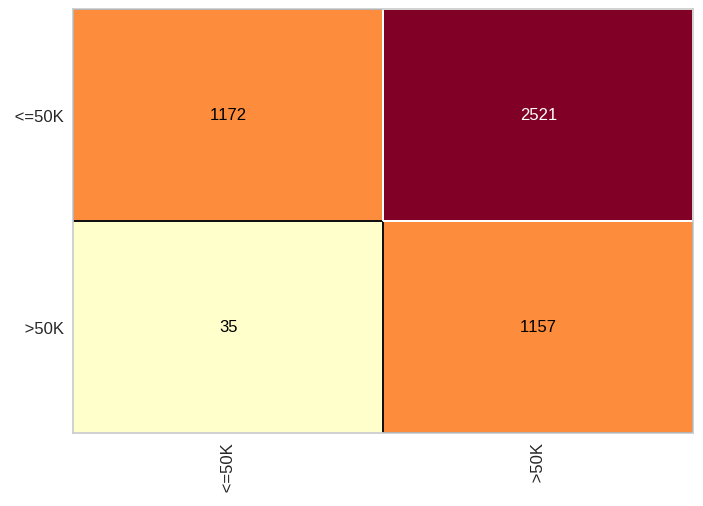

In [52]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(naive_censo)
cm.fit(X_censo_treinamento, y_censo_treinamento)
cm.score(X_censo_teste, y_censo_teste)

In [53]:
print(classification_report(y_censo_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.97      0.32      0.48      3693
        >50K       0.31      0.97      0.48      1192

    accuracy                           0.48      4885
   macro avg       0.64      0.64      0.48      4885
weighted avg       0.81      0.48      0.48      4885



## Árvore de decisão - 81%

In [54]:
with open('censo.pkl', 'rb') as f:
    X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste = pickle.load(f)

In [55]:
X_censo_treinamento.shape, y_censo_treinamento.shape

((27676, 108), (27676,))

In [56]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

In [57]:
from sklearn.tree import DecisionTreeClassifier

In [58]:
arvore_censo = DecisionTreeClassifier(criterion='entropy', random_state=0)
arvore_censo.fit(X_censo_treinamento, y_censo_treinamento)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [59]:
previsoes = arvore_censo.predict(X_censo_teste)
previsoes

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

In [60]:
y_censo_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' <=50K'],
      dtype=object)

In [61]:
accuracy_score(y_censo_teste, previsoes)

0.8104401228249745

0.8104401228249745

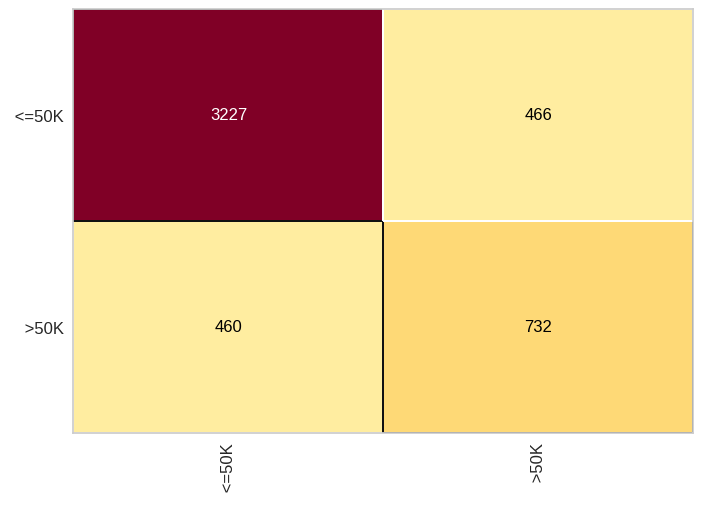

In [62]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(arvore_censo)
cm.fit(X_censo_treinamento, y_censo_treinamento)
cm.score(X_censo_teste, y_censo_teste)

In [63]:
print(classification_report(y_censo_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.88      0.87      0.87      3693
        >50K       0.61      0.61      0.61      1192

    accuracy                           0.81      4885
   macro avg       0.74      0.74      0.74      4885
weighted avg       0.81      0.81      0.81      4885



## Random Forest - 85% (70 árvores)

In [64]:
with open('censo.pkl', 'rb') as f:
    X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste = pickle.load(f)

In [65]:
X_censo_treinamento.shape, y_censo_treinamento.shape

((27676, 108), (27676,))

In [66]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

In [67]:
from sklearn.ensemble import RandomForestClassifier

In [68]:
rf_censo = RandomForestClassifier(n_estimators=70, criterion='entropy', random_state=0)
rf_censo.fit(X_censo_treinamento, y_censo_treinamento)

RandomForestClassifier(criterion='entropy', n_estimators=70, random_state=0)

In [69]:
previsoes = rf_censo.predict(X_censo_teste)
previsoes

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

In [70]:
from sklearn.metrics import accuracy_score, classification_report
accuracy = accuracy_score(y_censo_teste, previsoes)
accuracy

0.8501535312180143

0.8501535312180143

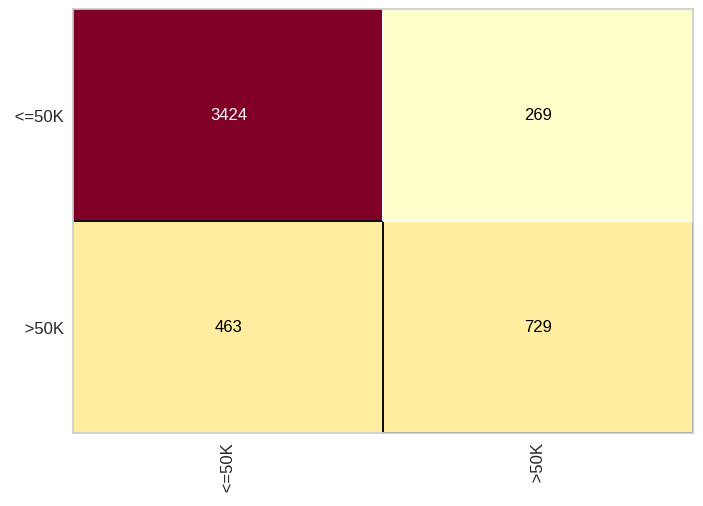

In [71]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(rf_censo)
cm.fit(X_censo_treinamento, y_censo_treinamento)
cm.score(X_censo_teste, y_censo_teste)

In [72]:
print(classification_report(y_censo_teste, previsoes))

              precision    recall  f1-score   support

       <=50K       0.88      0.93      0.90      3693
        >50K       0.73      0.61      0.67      1192

    accuracy                           0.85      4885
   macro avg       0.81      0.77      0.78      4885
weighted avg       0.84      0.85      0.85      4885



## Aprendizagem por regras - 82,04%

In [73]:
!pip install Orange3

In [74]:
import Orange

In [75]:
base_censo = Orange.data.Table('census_regras.csv')

In [76]:
base_censo.domain

[age, workclass, final-weight, education, education-num, marital-status, occupation, relationship, race, sex, capital-gain, capital-loos, hour-per-week, native-country | income]

In [77]:
base_dividida = Orange.evaluation.testing.sample(base_censo, n = 0.15)

In [78]:
base_dividida

([[18, Private, 163787, Some-college, 10, ... | <=50K],
  [42, Private, 124692, HS-grad, 9, ... | <=50K],
  [23, ?, 281668, 10th, 6, ... | <=50K],
  [28, Private, 191342, Some-college, 10, ... | <=50K],
  [55, Private, 119751, Masters, 14, ... | <=50K],
  ...
 ],
 [[30, Private, 226443, Bachelors, 13, ... | >50K],
  [20, Private, 172047, Some-college, 10, ... | <=50K],
  [31, Private, 123983, Some-college, 10, ... | <=50K],
  [36, Private, 136343, Bachelors, 13, ... | >50K],
  [20, Private, 275357, Assoc-voc, 11, ... | <=50K],
  ...
 ])

In [84]:
base_treinamento = base_dividida[1]
base_teste = base_dividida[0]

In [85]:
len(base_treinamento), len(base_teste)

(27677, 4884)

In [87]:
cn2 = Orange.classification.rules.CN2Learner()
regras_censo = cn2(base_treinamento)

In [89]:
for regras in regras_censo.rule_list:
    print(regras)

IF workclass==Never-worked THEN income=<=50K 
IF workclass==Without-pay THEN income=<=50K 
IF education==Preschool THEN income=<=50K 
IF occupation==Priv-house-serv THEN income=<=50K 
IF capital-loos>=3770.0 THEN income=<=50K 
IF native-country==Holand-Netherlands THEN income=<=50K 
IF native-country==Outlying-US(Guam-USVI-etc) THEN income=<=50K 
IF age<=21.0 AND workclass==Federal-gov THEN income=<=50K 
IF age<=21.0 AND workclass==Local-gov THEN income=<=50K 
IF age<=21.0 AND workclass!=Private THEN income=<=50K 
IF age<=21.0 AND education==1st-4th THEN income=<=50K 
IF age<=21.0 AND education==5th-6th THEN income=<=50K 
IF age<=21.0 AND education==9th THEN income=<=50K 
IF age<=21.0 AND education==10th THEN income=<=50K 
IF age<=21.0 AND education==11th THEN income=<=50K 
IF age<=24.0 AND workclass==Federal-gov THEN income=<=50K 
IF age<=24.0 AND education==1st-4th THEN income=<=50K 
IF age<=24.0 AND education==5th-6th THEN income=<=50K 
IF age<=24.0 AND education==9th THEN income=<=

In [90]:
previsoes = Orange.evaluation.testing.TestOnTestData(base_treinamento, base_teste, [lambda testdata: regras_censo])

In [91]:
previsoes

In [92]:
Orange.evaluation.CA(previsoes)

array([0.82043407])

## Classificador base - Majority learner - 75,9%

In [79]:
base_censo = Orange.data.Table('census_regras.csv')

In [80]:
base_censo.domain

[age, workclass, final-weight, education, education-num, marital-status, occupation, relationship, race, sex, capital-gain, capital-loos, hour-per-week, native-country | income]

In [81]:
majority = Orange.classification.MajorityLearner()

In [82]:
previsoes = Orange.evaluation.testing.TestOnTestData(base_censo, base_censo, [majority])
Orange.evaluation.CA(previsoes)

array([0.75919044])

## Aprendizagem baseada em instâncias (kNN) - 82,2%

In [83]:
import pickle
with open ('censo.pkl', 'rb') as f:
    X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste = pickle.load(f)


In [84]:
X_censo_treinamento.shape, y_censo_treinamento.shape

((27676, 108), (27676,))

In [85]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

In [86]:
from sklearn.neighbors import KNeighborsClassifier

In [87]:
knn_censo = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p = 2)
knn_censo.fit(X_censo_treinamento, y_censo_treinamento)

KNeighborsClassifier()

In [88]:
previsoes = knn_censo.predict(X_censo_teste)
previsoes

array([' <=50K', ' <=50K', ' >50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

In [89]:
y_censo_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' <=50K'],
      dtype=object)

In [90]:
from sklearn.metrics import accuracy_score, classification_report
accuracy_score(y_censo_teste, previsoes)

0.8223132036847492

0.8223132036847492

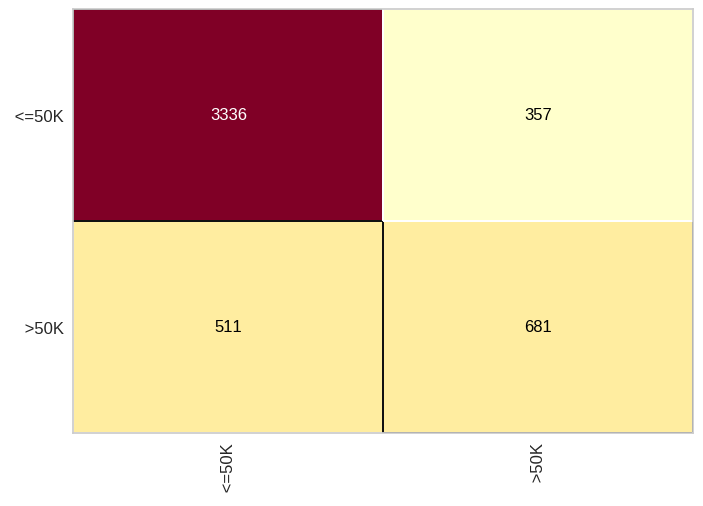

In [91]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(knn_censo)
cm.fit(X_censo_treinamento, y_censo_treinamento)
cm.score(X_censo_teste, y_censo_teste)

## Regressão logística - 84,9%

In [92]:
import pickle
with open ('censo.pkl', 'rb') as f:
    X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste = pickle.load(f)

In [93]:
X_censo_treinamento.shape, y_censo_treinamento.shape

((27676, 108), (27676,))

In [94]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

In [95]:
from sklearn.linear_model import LogisticRegression

In [96]:
lr_censo = LogisticRegression(random_state=1)
lr_censo.fit(X_censo_treinamento, y_censo_treinamento)

LogisticRegression(random_state=1)

In [97]:
lr_censo.intercept_

array([-2.10474165])

In [98]:
lr_censo.coef_

array([[-6.94469649e-02,  1.18679159e-01, -9.04524758e-03,
        -7.81357460e-02,  5.76691457e-02,  5.08994420e-02,
        -8.82856549e-02, -5.01462809e-02, -1.42900810e-01,
        -1.04784027e-01, -1.19233556e-01, -3.77074867e-02,
        -2.08124820e-02, -2.93974652e-02, -8.45705964e-02,
        -8.08920718e-02, -8.16248852e-03,  1.09035256e-02,
         1.46893853e-01,  1.20194939e-01, -7.84325002e-02,
         1.45553932e-01, -4.75278833e-01,  1.14436730e-01,
         2.27948173e-02, -1.93347518e-01,  4.38094226e-02,
         7.07825942e-01, -6.57034078e-02, -5.23341515e-01,
        -1.09247966e-01, -8.94357349e-02, -7.42801130e-02,
        -1.40912231e-02, -2.06468670e-02,  2.21547856e-02,
         2.51784840e-01, -1.68183468e-01, -1.43046856e-01,
        -8.47285978e-02, -2.55735605e-01, -2.68986405e-01,
         1.61655356e-01,  8.57817041e-02,  8.33259769e-02,
         1.08967512e-01, -2.56717036e-02, -2.99250092e-02,
         1.37854640e-01, -8.45026445e-02, -3.08580420e-0

In [99]:
prev = lr_censo.predict(X_censo_teste)
prev

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

In [100]:
y_censo_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' <=50K'],
      dtype=object)

In [101]:
from sklearn.metrics import accuracy_score, classification_report
accuracy_score(y_censo_teste, prev)

0.849539406345957

0.849539406345957

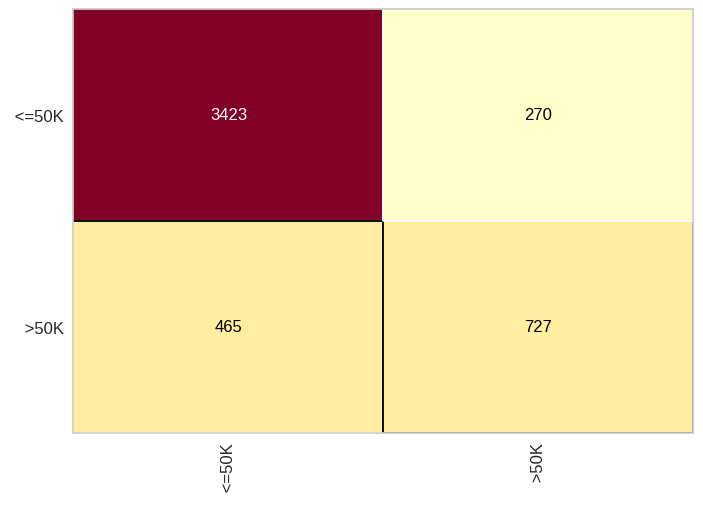

In [102]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(lr_censo)
cm.fit(X_censo_treinamento, y_censo_treinamento)
cm.score(X_censo_teste, y_censo_teste)

In [103]:
print(classification_report(y_censo_teste, prev))

              precision    recall  f1-score   support

       <=50K       0.88      0.93      0.90      3693
        >50K       0.73      0.61      0.66      1192

    accuracy                           0.85      4885
   macro avg       0.80      0.77      0.78      4885
weighted avg       0.84      0.85      0.84      4885



## Máquinas de vetores de suporte (SVM) - 85%(linear)

In [104]:
import pickle
with open ('censo.pkl', 'rb') as f:
    X_censo_treinamento, y_censo_treinamento, X_censo_teste, y_censo_teste = pickle.load(f)

In [105]:
X_censo_treinamento.shape, y_censo_treinamento.shape

((27676, 108), (27676,))

In [106]:
X_censo_teste.shape, y_censo_teste.shape

((4885, 108), (4885,))

In [107]:
from sklearn.svm import SVC

In [108]:
svm_censo = SVC(kernel='linear', random_state=1)
svm_censo.fit(X_censo_treinamento, y_censo_treinamento)

SVC(kernel='linear', random_state=1)

In [109]:
prev = svm_censo.predict(X_censo_teste)
prev

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

In [110]:
y_censo_teste

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' <=50K'],
      dtype=object)

In [111]:
accuracy_score(y_censo_teste, prev)

0.8507676560900717

0.8507676560900717

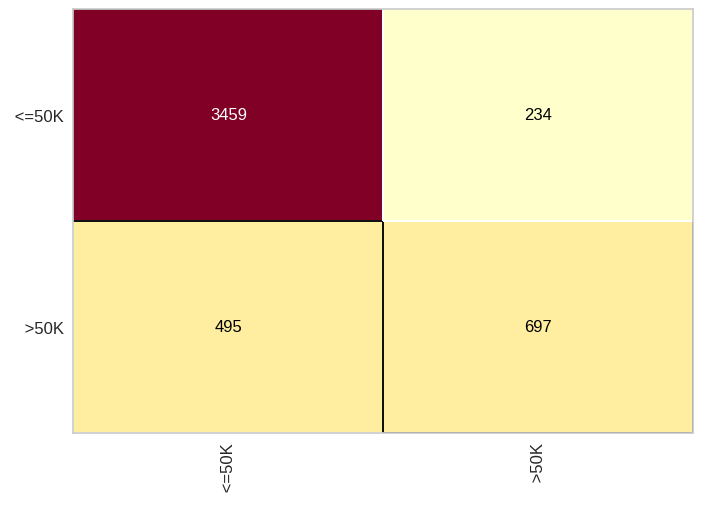

In [112]:
from yellowbrick.classifier import ConfusionMatrix
cm = ConfusionMatrix(svm_censo)
cm.fit(X_censo_treinamento, y_censo_treinamento)
cm.score(X_censo_teste, y_censo_teste)